# Stereovision

![Suzanne](main.png)

Stereovision is a discipline that deals with the reconstruction of 3D information from images. For the reconstruction of a point, several images of this point are needed. These images must be taken from different points of view. The key step of the reconstruction, which is often problematic, is to identify the images of the point to be reconstructed in each view.

## Epipolar Geometry

Epipolar geometry involves two cameras. The epipolar geometry describes the geometric properties between two views of the same scene and depends only on the intrinsic parameters of the cameras and their relative positions. It provides, in particular, the epipolar constraint, which will be very useful to produce the matches between views.

## The Fondamental Matrix

![Epipolar Geometry - Sanyam Kapoor](epipolar.png)

Let us imagine that we have two images, right and left, of the world space. Let's take a point $\vec{x}$ in the right image space. The point $\vec{X}$ of the world space, of which $\vec{x}$ is the image, can be anywhere on the line passing through $\vec{x}$ and the optical center of the right camera. We will call this line the back-projected ray of $\vec{x}$. Let us note $\vec{x}'$ the image of $\vec{X}$ in the left image space. The locus of $\vec{x}'$ is therefore the image line of the back-projected ray of $\vec{x}$. This line is called the epipolar line and is denoted $\vec{l}'$. The epipolar line passes through the epipole $\vec{e}'$, image of the optical center of the right camera.

In 2D projective geometry, a line with equation $ax+by+c = 0$ is represented by a vector with three components $(a, b, c)^T$ defined to within one factor. Thus, we have the following relationship:

>The point $\vec{x}$ belongs to the line $\vec{l}$ if and only if $x^T\vec{l} = 0$.

Moreover, in 2D projective geometry, the following remarkable relations are valid:

- The intersection of two lines $l$ and $l'$ is given by $x = l \times l'$,
- The line passing through two points $x$ and $x'$ is given by $l = x \times x'$.

Note that the vector product can be written as a product of matrix $x \times y = [x]_\times y$ where

$$[x]_\times = \begin{pmatrix} 0 & −x3 & x2 \\ x3 & 0 & −x1 \\ −x2 & x1 & 0 \end{pmatrix}$$

To find the equation of the epipolar line in the left image space, we just need to find the coordinates of two points of this line. The first is the image $P'\vec{C}$ of the optical center $\vec{C}$ of the right camera where $P'$ is the projection matrix of the left camera. The second is $P'P^{+}\vec{x}$ where $P^{+}$ is the pseudo inverse of the projection matrix $P$ of the right camera. The epipolar line thus has the equation $l' = [P'\vec{C}]_\times{}P'P^{+}\vec{x} = F\vec{x}$ with $F = [P'\vec{C}]_\times{}P'P^{+}$. $F$ is called fundamental matrix.

Since the epipolar line $\vec{l}' = F\vec{x}$ is the locus of $\vec{x}'$, $\vec{x}'$ therefore belongs to $\vec{l}'$ which leads to the epipolar constraint :

>**The fundamental matrix is such that for any pair of points corresponding $\vec{x} \leftrightarrow \vec{x}'$ in the two images, we have $\vec{x}'^{T}F\vec{x} = 0$.**

## Computation of the fundamental matrix

The fundamental matrix $F$ has seven degrees of freedom. It has nine components but these are defined to within one scale factor, which removes one degree of freedom. Moreover, the matrix $F$ is a singular matrix ($det(F) = 0$) which gives us seven degrees of freedom. So we need at least seven correspondences to compute $F$. The equation $x'^{T}_iFx_i = 0$ and the seven correspondences allow us to write a system of equations of the form $Af = 0$, where $f$ is the vector which contains the components of the matrix $F$. Let us assume that $A$ is a 7×9 matrix of rank 7. The general solution of $Af = 0$ can be written $\alpha f_1 + (1-\alpha) f_2$ where $f_1$ and $f_2$ are two particular independent solutions of $Af = 0$. We then use the singularity constraint $det(\alpha F_1 + (1 - \alpha)F_2) = 0$ to determine $\alpha$. Since the singularity constraint gives rise to a third degree equation, we may have one or three solutions for $F$.

## OpenCV

In practice you will use the OpenCV library. In python, you have access to its functions through the `cv2` module.

You can find help with the calibration and reconstruction functions on the site https://docs.opencv.org/4.0.0/d9/d0c/group__calib3d.html

## Goal

In the zip of the statement you will find two sequences of images taken by two cameras during the scanning of an object by a laser plane.

![Laser](scanRight/scan0010.png)

You will also find shots of a checkerboard in different positions that will help you calibrate your cameras.

![Damier](chessboards/c2Right.png)

The goal is to reconstruct the scanned object in 3D.

# Checkerboard reconstruction

## 1.1 Imports
We import the fundamental libraries for the project

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

## 1.2 File openings

In [2]:
c1L = cv2.imread("./chessboards/c1Left.png")
c1R = cv2.imread("./chessboards/c1Right.png")
c2L = cv2.imread("./chessboards/c2Left.png")
c2R = cv2.imread("./chessboards/c2Right.png")
c3L = cv2.imread("./chessboards/c3Left.png")
c3R = cv2.imread("./chessboards/c3Right.png")
c4L = cv2.imread("./chessboards/c4Left.png")
c4R = cv2.imread("./chessboards/c4Right.png")

imagesL = [c1L, c2L, c3L, c4L]
imagesR = [c1R, c2R, c3R, c4R]
h, w = imagesL[0].shape[:2]
img_size = (w, h)
print("Image size:", img_size)

Image size: (1920, 1080)


## 2. World Geometry Definition (3D Points)
Before calibrating, we must define what the "real" object looks like.
* **`objp`**: We generate a perfect grid of $(X, Y, Z)$ coordinates.
* **Planar Assumption ($Z=0$)**: We set $Z=0$ for all points because the chessboard is a flat object. This constraint is what allows us to compute the focal lengths later.

In [3]:
pattern_size = (7, 7) #(nbr de cases longueur - 1, largeur - 1)


square_size = 1.0 # Conséquence : la reconstruction 3D sera à l'échelle "1 carré = 1 unité"

# --- Construction des points 3D du damier (monde) ---
# objp = "object points" = coordonnées 3D connues des coins du damier
# Format attendu : (N, 3) avec N = 49 ici, et (x, y, z)
objp = np.zeros((pattern_size[0] * pattern_size[1], 3), dtype=np.float32)

# On remplit x et y avec une grille régulière : (0..6, 0..6), et z reste à 0 (damier plat)
# np.mgrid crée une grille d'indices, puis on reshape en liste de points (N, 2)
objp[:, :2] = np.mgrid[0:pattern_size[0], 0:pattern_size[1]].T.reshape(-1, 2)

# On applique l'échelle (taille d'un carré)
objp *= square_size

# --- Listes où on accumulera les données pour calibrateCamera / stereoCalibrate ---
# objpoints  : liste de tableaux (N,3) -> points 3D du damier pour chaque image (souvent identique)
# imgpointsL : liste de tableaux (N,1,2) -> coins 2D détectés dans l'image gauche
# imgpointsR : liste de tableaux (N,1,2) -> coins 2D détectés dans l'image droite
objpoints  = []
imgpointsL = []
imgpointsR = []

print("objp shape:", objp.shape)   # doit afficher (49, 3)
print("First 5 objp points:\n", objp[:5])


objp shape: (49, 3)
First 5 objp points:
 [[0. 0. 0.]
 [1. 0. 0.]
 [2. 0. 0.]
 [3. 0. 0.]
 [4. 0. 0.]]


## 3. Control Points Extraction (Detection)
We iterate through all image pairs to find the chessboard corners.
* **Robust Strategy**: The code attempts multiple methods (classic, CLAHE for contrast, SB) to maximize the number of usable images.
* **`cornerSubPix`**: Once corners are found at the pixel level, this function refines their position to *sub-pixel* accuracy. Without this step, the final triangulation error would be too high for 3D scanning.

In [4]:
# Chessboard detection 


criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 1e-6)

# Flags pour la méthode classique (souvent aide)
flags = cv2.CALIB_CB_ADAPTIVE_THRESH + cv2.CALIB_CB_NORMALIZE_IMAGE

# Prétraitement (contraste local)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

# Reset des listes (important si tu relances la cellule)
objpoints  = []
imgpointsL = []
imgpointsR = []

valid_imagesL = []
valid_imagesR = []
valid_ids = []

methods_used = []  # pour afficher quelle méthode a marché

for i in range(len(imagesL)):

    imgL = imagesL[i]
    imgR = imagesR[i]

    # RGBA -> BGR si besoin
    if len(imgL.shape) == 3 and imgL.shape[2] == 4:
        imgL = cv2.cvtColor(imgL, cv2.COLOR_BGRA2BGR)
    if len(imgR.shape) == 3 and imgR.shape[2] == 4:
        imgR = cv2.cvtColor(imgR, cv2.COLOR_BGRA2BGR)

    grayL = cv2.cvtColor(imgL, cv2.COLOR_BGR2GRAY)
    grayR = cv2.cvtColor(imgR, cv2.COLOR_BGR2GRAY)

    # Versions prétraitées
    gL = clahe.apply(grayL)
    gR = clahe.apply(grayR)

    # --- On essaye plusieurs méthodes, dans un ordre simple ---
    # Chaque "tentative" doit retourner (found, corners)
    # On teste toujours la même méthode à gauche et à droite pour rester cohérent.

    # Tentative 1 : classique sur gray brut
    foundL1, cornersL1 = cv2.findChessboardCorners(grayL, pattern_size, flags)
    foundR1, cornersR1 = cv2.findChessboardCorners(grayR, pattern_size, flags)

    # Tentative 2 : classique sur CLAHE
    foundL2, cornersL2 = cv2.findChessboardCorners(gL, pattern_size, flags)
    foundR2, cornersR2 = cv2.findChessboardCorners(gR, pattern_size, flags)

    # Tentative 3 : SB sur CLAHE (souvent récupère les cas durs)
    foundL3, cornersL3 = cv2.findChessboardCornersSB(gL, pattern_size)
    foundR3, cornersR3 = cv2.findChessboardCornersSB(gR, pattern_size)

    # Choix de la première tentative qui marche des DEUX côtés
    chosen = None
    if foundL1 and foundR1:
        chosen = ("classic_gray", cornersL1, cornersR1, grayL, grayR)
    elif foundL2 and foundR2:
        chosen = ("classic_CLAHE", cornersL2, cornersR2, gL, gR)
    elif foundL3 and foundR3:
        chosen = ("SB_CLAHE", cornersL3, cornersR3, gL, gR)

    if chosen is None:
        # 0 discard => on stoppe net : impossible d'utiliser cette paire sans coins.
        raise RuntimeError(
            f"Pair {i+1}: impossible de détecter le damier (aucune méthode n'a marché)."
        )

    method_name, cornersL, cornersR, refineL_img, refineR_img = chosen
    print(f"Pair {i+1}: OK with {method_name}")

    # Raffinement subpixel (sur l'image utilisée pour la détection/refine)
    cornersL = cv2.cornerSubPix(refineL_img, cornersL, (11,11), (-1,-1), criteria)
    cornersR = cv2.cornerSubPix(refineR_img, cornersR, (11,11), (-1,-1), criteria)

    # Stockage (donc on "accepte" toutes les paires car on a forcé une méthode qui marche)
    objpoints.append(objp)
    imgpointsL.append(cornersL)
    imgpointsR.append(cornersR)

    valid_imagesL.append(imgL)
    valid_imagesR.append(imgR)
    valid_ids.append(i)

    methods_used.append(method_name)

print("Number of stereo pairs used:", len(valid_ids))
print("Methods used per pair:", methods_used)


[ERROR:0@0.818] global ocl.cpp:4677 createFromBinary OpenCL error CL_INVALID_VALUE (-30) during call: clCreateProgramWithBinary


Pair 1: OK with classic_gray
Pair 2: OK with classic_gray
Pair 3: OK with SB_CLAHE
Pair 4: OK with classic_gray
Number of stereo pairs used: 4
Methods used per pair: ['classic_gray', 'classic_gray', 'SB_CLAHE', 'classic_gray']


## 4. Corner visualization

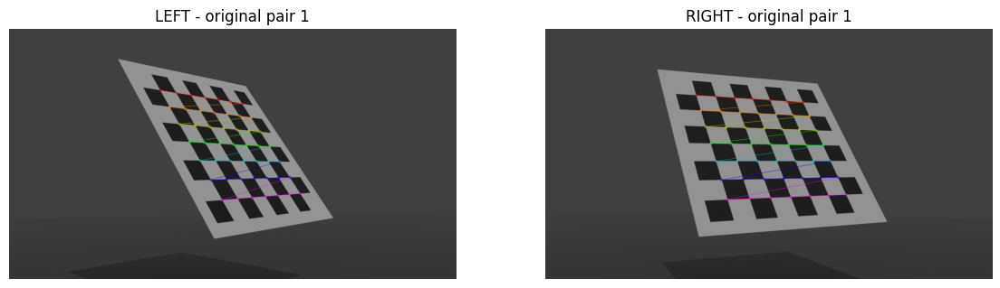

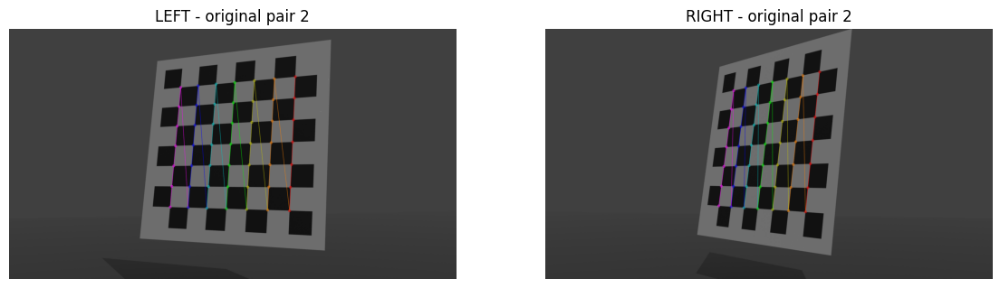

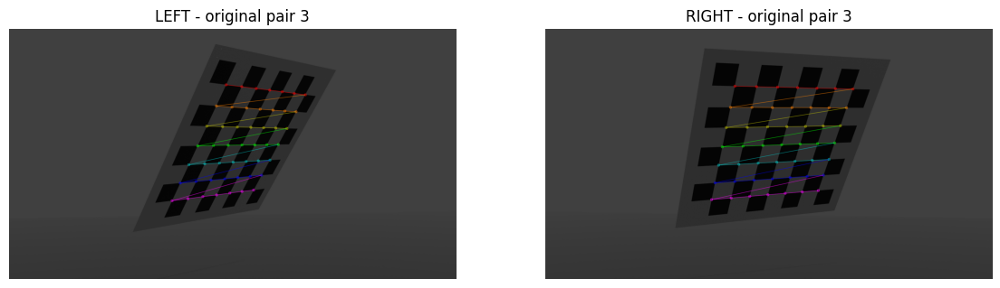

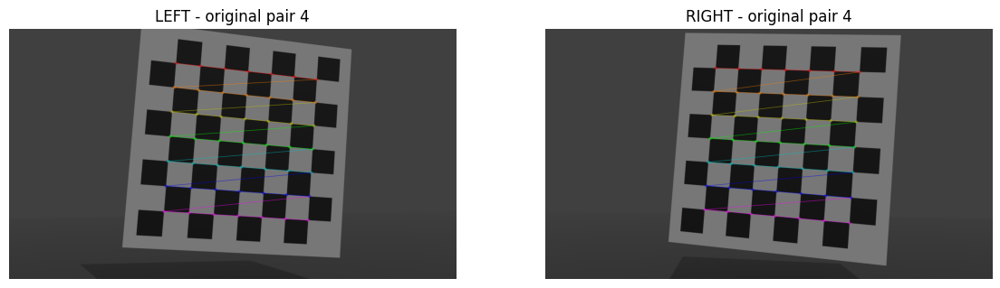

In [5]:
# On parcourt toutes les paires valides
for idx in range(len(valid_ids)):

    # idx = index dans les listes filtrées (valid_images*, imgpoints*)
    # orig = index dans les listes originales (imagesL/imagesR)
    orig = valid_ids[idx]

    # Copies pour dessiner sans modifier les images stockées
    imgL = valid_imagesL[idx].copy()
    imgR = valid_imagesR[idx].copy()

    # Dessin des coins détectés
    cv2.drawChessboardCorners(imgL, pattern_size, imgpointsL[idx], True)
    cv2.drawChessboardCorners(imgR, pattern_size, imgpointsR[idx], True)

    # Affichage côte à côte
    plt.figure(figsize=(14, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(imgL, cv2.COLOR_BGR2RGB))
    plt.title(f"LEFT - original pair {orig+1}")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(imgR, cv2.COLOR_BGR2RGB))
    plt.title(f"RIGHT - original pair {orig+1}")
    plt.axis("off")

    plt.show()


## 5. Intrinsic Calibration
Here, we calculate the optical identity of each camera independently by minimizing the reprojection error.
* **Intrinsic Matrix ($P_{int}$)**: Contains the focal lengths ($f_x, f_y$) and the optical center ($c_x, c_y$).
* **Distortion (`dist`)**: The coefficients $(k_1, k_2...)$ used to correct the lens radial distortion (fisheye effect).

### 5.1 Left camera calibration

In [6]:
# --- Calibration caméra gauche ---

# Taille de l'image (w, h) attendue par OpenCV
h, w = valid_imagesL[0].shape[:2]
img_size = (w, h)

# Calibration : trouve P1_int (intrinsics) et dist1 (distortion)
retL, P1_int, dist1, rvecs1, tvecs1 = cv2.calibrateCamera(
    objpoints,      # points 3D du damier (monde)
    imgpointsL,     # coins 2D détectés dans l'image gauche
    img_size,       # taille image (w,h)
    None, None      # on laisse OpenCV initialiser
)

print("Left camera RMS reprojection error:", retL)
print("\nP1_int (intrinsic matrix):\n", P1_int)
print("\ndist1 (distortion coeffs):\n", dist1.ravel())


Left camera RMS reprojection error: 0.037717169867349

P1_int (intrinsic matrix):
 [[2.09963743e+03 0.00000000e+00 9.60246921e+02]
 [0.00000000e+00 2.09965823e+03 5.38799156e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]

dist1 (distortion coeffs):
 [-3.77123445e-03  2.55889803e-02 -1.45814478e-04  1.48267838e-04
  9.41341818e-01]


### 5.2 Right camera calibration

In [7]:
# --- Calibration caméra droite ---

# Taille de l'image (w, h) attendue par OpenCV
h, w = valid_imagesR[0].shape[:2]
img_size = (w, h)

# Calibration : trouve P2_int (intrinsics) et dist2 (distortion)
retR, P2_int, dist2, rvecs2, tvecs2 = cv2.calibrateCamera(
    objpoints,      # points 3D du damier (monde)
    imgpointsR,     # coins 2D détectés dans l'image droite
    img_size,       # taille image (w,h)
    None, None      # on laisse OpenCV initialiser
)

print("Right camera RMS reprojection error:", retR)
print("\nP2_int (intrinsic matrix):\n", P2_int)
print("\ndist2 (distortion coeffs):\n", dist2.ravel())


Right camera RMS reprojection error: 0.04168713369982551

P2_int (intrinsic matrix):
 [[2.10011723e+03 0.00000000e+00 9.59785710e+02]
 [0.00000000e+00 2.10002974e+03 5.39844374e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]

dist2 (distortion coeffs):
 [-7.31723166e-03  2.70274618e-01  2.68669841e-06  3.74432767e-05
 -2.94148448e+00]


## 6. Stereo Calibration
This step links the two cameras together.
* **Rotation ($R$) & Translation ($T$)**: We calculate the exact position of the Right camera relative to the Left camera (the "Baseline").
* **Fundamental Matrix ($F$)**: Summarizes the epipolar geometry of the system. It enforces the constraint: "If I have a point $x$ on the left, its corresponding point on the right must lie on the line $F \cdot x$".

In [8]:
# --- Calibration stéréo (R, T, E, F) ---

# Taille image (w,h)
h, w = valid_imagesL[0].shape[:2]
img_size = (w, h)

# Critères d'optimisation pour stereoCalibrate
stereo_criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 1e-6)

# On garde les intrinsics trouvées en cellule 6/7 (K1, dist1, K2, dist2)
# CALIB_FIX_INTRINSIC = on n'optimise que R,T (et E,F), pas les intrinsics
flags = cv2.CALIB_FIX_INTRINSIC

retStereo, P1s_int, dist1s, P2s_int, dist2s, R, T, E, F = cv2.stereoCalibrate(
    objpoints,      # points 3D damier
    imgpointsL,     # coins 2D gauche
    imgpointsR,     # coins 2D droite
    P1_int, dist1,      # intrinsics caméra gauche
    P2_int, dist2,      # intrinsics caméra droite
    img_size,
    criteria=stereo_criteria,
    flags=flags
)

print("Stereo RMS reprojection error:", retStereo)
print("\nR (rotation):\n", R)
print("\nT (translation):\n", T.ravel())
print("\nE (essential matrix):\n", E)
print("\nF (fundamental matrix):\n", F)


Stereo RMS reprojection error: 12.368004817666515

R (rotation):
 [[ 0.94151054  0.01622907  0.3365925 ]
 [-0.01582569  0.999867   -0.00394204]
 [-0.33661171 -0.00161534  0.94164215]]

T (translation):
 [-7.34165991  0.07694936  1.09093092]

E (essential matrix):
 [[-8.63732228e-03 -1.09091012e+00  7.67592542e-02]
 [-1.44416575e+00  5.84554070e-03  7.28041563e+00]
 [ 4.37381943e-02 -7.34193225e+00  3.04053084e-03]]

F (fundamental matrix):
 [[ 5.78344210e-09  7.30452428e-07 -5.07035809e-04]
 [ 9.67035459e-07 -3.91422463e-09 -1.11623792e-02]
 [-5.89104691e-04  9.62524635e-03  1.00000000e+00]]


## 7. Stereo Rectification
We compute the mathematical transformations ($R1, R2, P1, P2$) to virtually align the two cameras.
* **Goal**: To make the image planes coplanar and align epipolar lines horizontally.
* **Benefit**: This drastically simplifies the matching process. A point on line $Y=100$ in the left image will necessarily be on line $Y=100$ in the right image. We turn a 2D search problem into a much faster 1D search.

In [9]:
# --- Rectification stéréo ---

h, w = valid_imagesL[0].shape[:2]
img_size = (w, h)

# alpha=0 => recadrage maximal (plus propre), alpha=1 => garde tout (bords noirs)
alpha = 0.5
R1, R2, P1, P2, Q, roi1, roi2 = cv2.stereoRectify(
    P1_int, dist1,
    P2_int, dist2,
    img_size,
    R, T,
    alpha=alpha
)
P1_rect, P2_rect = P1.copy(), P2.copy()

print("R1:\n", R1)
print("\nR2:\n", R2)
print("\nP1:\n", P1_rect)
print("\nP2:\n", P2_rect)
print("\nQ:\n", Q)
print("\nROI1:", roi1)
print("ROI2:", roi2)


R1:
 [[ 9.80871931e-01  5.92393712e-03  1.94564032e-01]
 [-5.86517531e-03  9.99982414e-01 -8.78102246e-04]
 [-1.94565812e-01 -2.79846308e-04  9.80889426e-01]]

R2:
 [[ 9.89086199e-01 -1.03668042e-02 -1.46972855e-01]
 [ 1.04111002e-02  9.99945694e-01 -4.67880202e-04]
 [ 1.46969724e-01 -1.06737528e-03  9.89140415e-01]]

P1:
 [[2.62332237e+03 0.00000000e+00 9.02560585e+02 0.00000000e+00]
 [0.00000000e+00 2.62332237e+03 5.41313995e+02 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00 0.00000000e+00]]

P2:
 [[ 2.62332237e+03  0.00000000e+00  9.02560585e+02 -1.94720548e+04]
 [ 0.00000000e+00  2.62332237e+03  5.41313995e+02  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00  0.00000000e+00]]

Q:
 [[ 1.00000000e+00  0.00000000e+00  0.00000000e+00 -9.02560585e+02]
 [ 0.00000000e+00  1.00000000e+00  0.00000000e+00 -5.41313995e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  2.62332237e+03]
 [ 0.00000000e+00  0.00000000e+00  1.34722421e-01 -0.00000000e+00]]

RO

## 8. Applying Rectification
We apply the previously calculated matrices to the image pixels.
* **`initUndistortRectifyMap`**: Computes a "distortion map" for every pixel.
* **`remap`**: Actually moves the pixels to correct optical distortion AND align the stereo images.

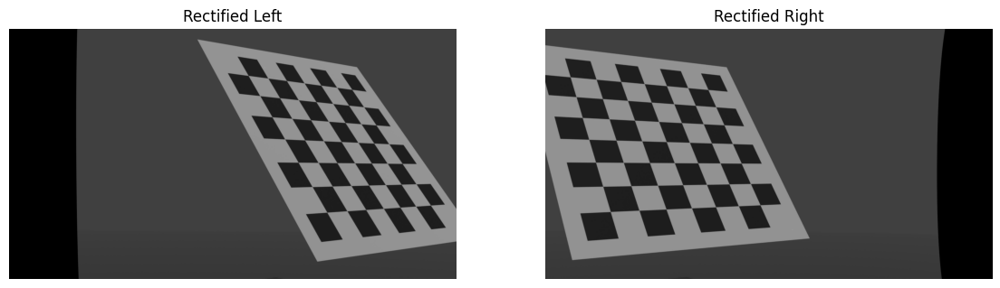

In [10]:
# --- Création des maps de rectification et application sur une paire ---

h, w = valid_imagesL[0].shape[:2]
img_size = (w, h)

# Maps de rectification (pour remap)
map1L, map2L = cv2.initUndistortRectifyMap(P1_int, dist1, R1, P1, img_size, cv2.CV_32FC1)
map1R, map2R = cv2.initUndistortRectifyMap(P2_int, dist2, R2, P2, img_size, cv2.CV_32FC1)

# Exemple : rectifier la première paire valide
idx = 0
imgL = valid_imagesL[idx]
imgR = valid_imagesR[idx]

rectL = cv2.remap(imgL, map1L, map2L, cv2.INTER_LINEAR)
rectR = cv2.remap(imgR, map1R, map2R, cv2.INTER_LINEAR)

# Affichage côte à côte
plt.figure(figsize=(14, 10))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(rectL, cv2.COLOR_BGR2RGB))
plt.title("Rectified Left")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(rectR, cv2.COLOR_BGR2RGB))
plt.title("Rectified Right")
plt.axis("off")

plt.show()


## 9. Epipolar Lines before and after rectification

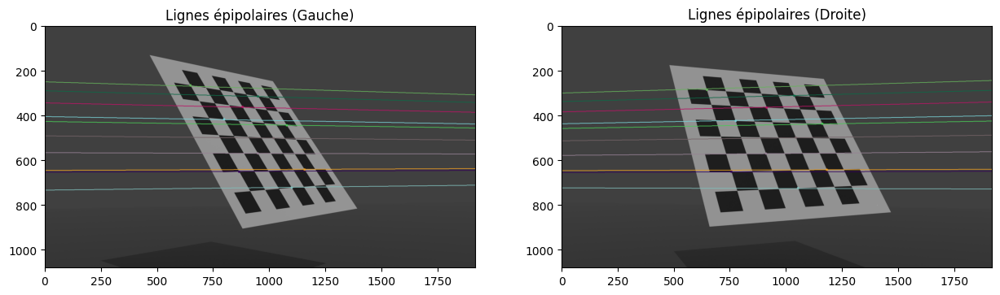

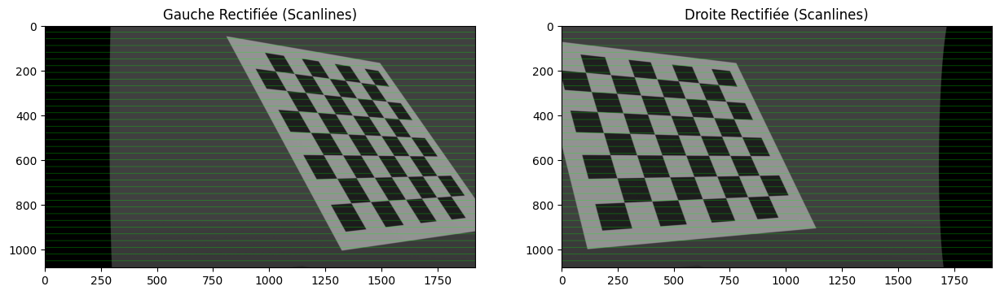

In [11]:
# --- 0. PRÉPARATION ---
# On convertit en gris pour l'affichage des lignes
imgL_visu = cv2.cvtColor(imagesL[0], cv2.COLOR_BGR2GRAY)
imgR_visu = cv2.cvtColor(imagesR[0], cv2.COLOR_BGR2GRAY)

ptsL_sample = imgpointsL[0]
ptsR_sample = imgpointsR[0]

# --- Fonction utilitaire modifiée pour accepter des couleurs imposées ---
def drawlines(img1, img2, lines, pts1, pts2, colors):
    r, c = img1.shape
    img1 = cv2.cvtColor(img1, cv2.COLOR_GRAY2BGR)
    img2 = cv2.cvtColor(img2, cv2.COLOR_GRAY2BGR)
    
    # On itère aussi sur la liste des couleurs fournies
    for r, pt1, pt2, color in zip(lines, pts1, pts2, colors):
        x0, y0 = map(int, [0, -r[2]/r[1]])
        x1, y1 = map(int, [c, -(r[2]+r[0]*c)/r[1]])
        img1 = cv2.line(img1, (x0, y0), (x1, y1), color, 2)
        img1 = cv2.circle(img1, tuple(pt1), 5, color, -1)
        img2 = cv2.circle(img2, tuple(pt2), 5, color, -1)
    return img1, img2

# --- 1. VISUALISATION AVANT RECTIFICATION (Couleurs Symétriques) ---

# Échantillonnage (1 point sur 5)
ptsL_sub = ptsL_sample[::5]
ptsR_sub = ptsR_sample[::5]

# --- NOUVEAU : On génère les couleurs UNE SEULE FOIS ici ---
# On crée autant de couleurs aléatoires qu'il y a de points
np.random.seed(42) # (Optionnel) Pour avoir toujours les mêmes couleurs à chaque exécution
colors_list = [tuple(np.random.randint(0, 255, 3).tolist()) for _ in range(len(ptsL_sub))]

# Calcul des lignes épipolaires
# 1. Lignes sur l'image de GAUCHE (correspondant aux points de Droite)
linesL = cv2.computeCorrespondEpilines(ptsR_sub.reshape(-1, 1, 2), 2, F)
linesL = linesL.reshape(-1, 3)

# 2. Lignes sur l'image de DROITE (correspondant aux points de Gauche)
linesR = cv2.computeCorrespondEpilines(ptsL_sub.reshape(-1, 1, 2), 1, F)
linesR = linesR.reshape(-1, 3)

# Dessin : On passe la MÊME liste 'colors_list' aux deux appels !
img5, _ = drawlines(imgL_visu, imgR_visu, linesL, ptsL_sub.reshape(-1, 2).astype(int), ptsR_sub.reshape(-1, 2).astype(int), colors_list)
img3, _ = drawlines(imgR_visu, imgL_visu, linesR, ptsR_sub.reshape(-1, 2).astype(int), ptsL_sub.reshape(-1, 2).astype(int), colors_list)

plt.figure(figsize=(15, 8))
plt.subplot(121), plt.imshow(img5), plt.title('Lignes épipolaires (Gauche)')
plt.subplot(122), plt.imshow(img3), plt.title('Lignes épipolaires (Droite)')
plt.show()

# --- 2. VISUALISATION APRÈS RECTIFICATION (Lignes Vertes) ---

if 'map1L' in locals() and 'map1R' in locals():
    rect_L = cv2.remap(imgL_visu, map1L, map2L, cv2.INTER_LINEAR)
    rect_R = cv2.remap(imgR_visu, map1R, map2R, cv2.INTER_LINEAR)

    rect_L_c = cv2.cvtColor(rect_L, cv2.COLOR_GRAY2BGR)
    rect_R_c = cv2.cvtColor(rect_R, cv2.COLOR_GRAY2BGR)
    
    for i in range(0, rect_L.shape[0], 30):
        cv2.line(rect_L_c, (0, i), (rect_L.shape[1], i), (0, 255, 0), 1)
        cv2.line(rect_R_c, (0, i), (rect_R.shape[1], i), (0, 255, 0), 1)

    plt.figure(figsize=(15, 8))
    plt.subplot(121), plt.imshow(rect_L_c), plt.title('Gauche Rectifiée (Scanlines)')
    plt.subplot(122), plt.imshow(rect_R_c), plt.title('Droite Rectifiée (Scanlines)')
    plt.show()
else:
    print("ATTENTION : Lance d'abord la cellule 'Stereo Rectification' !")

## 10. 3D Reconstruction

3D points shape: (49, 3)


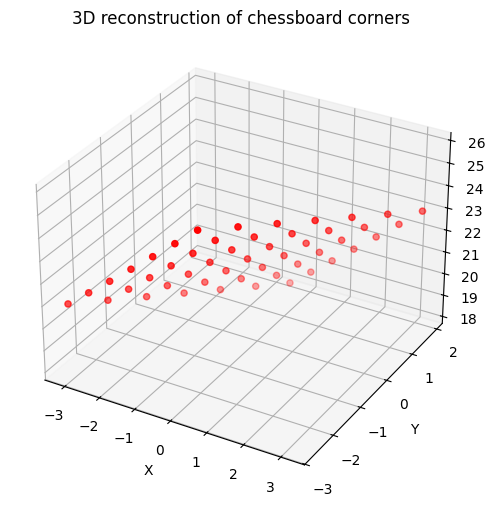

In [12]:
# --- Reconstruction 3D du damier par triangulation ---

# Matrices de projection
P1_cam = P1_int @ np.hstack((np.eye(3), np.zeros((3,1))))   # caméra gauche
P2_cam = P2_int @ np.hstack((R, T))                      # caméra droite

# On prend UNE paire valide (ex: la première)
ptsL = imgpointsL[0].reshape(-1, 2).T   # shape (2, N)
ptsR = imgpointsR[0].reshape(-1, 2).T

# Triangulation
points_4D = cv2.triangulatePoints(P1_cam, P2_cam, ptsL, ptsR)

# Passage homogène → 3D
points_3D = (points_4D[:3] / points_4D[3]).T   # shape (N, 3)

print("3D points shape:", points_3D.shape)

from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(
    points_3D[:,0],
    points_3D[:,1],
    points_3D[:,2],
    c='r',
    s=20
)

ax.set_title("3D reconstruction of chessboard corners")
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")

plt.show()


# MONKEY PART

## 11. Monkey files configuration

In [13]:
# --- listes de fichiers (noms connus, ordre garanti) ---

import os

# Dossiers (d'après ton screenshot)
folderL = "./scanLeft"
folderR = "./scanRight"

# Nombre d'images (0..25)
N = 26

# Construit les chemins : filesL[i] correspond à filesR[i]
filesL = [os.path.join(folderL, f"{i:04d}.png") for i in range(N)]
filesR = [os.path.join(folderR, f"scan{i:04d}.png") for i in range(N)]

# Vérification basique : est-ce que les fichiers existent ?
missingL = [p for p in filesL if not os.path.exists(p)]
missingR = [p for p in filesR if not os.path.exists(p)]

print("Nb attendus:", N)
print("Missing Left:", len(missingL))
print("Missing Right:", len(missingR))

# Debug : affiche 3 paires
for i in range(3):
    print(f"Pair {i}:")
    print("  L:", filesL[i])
    print("  R:", filesR[i])


Nb attendus: 26
Missing Left: 0
Missing Right: 0
Pair 0:
  L: ./scanLeft/0000.png
  R: ./scanRight/scan0000.png
Pair 1:
  L: ./scanLeft/0001.png
  R: ./scanRight/scan0001.png
Pair 2:
  L: ./scanLeft/0002.png
  R: ./scanRight/scan0002.png


## 12. Pair Display

Left shape : (1080, 1920, 3)
Right shape: (1080, 1920, 3)


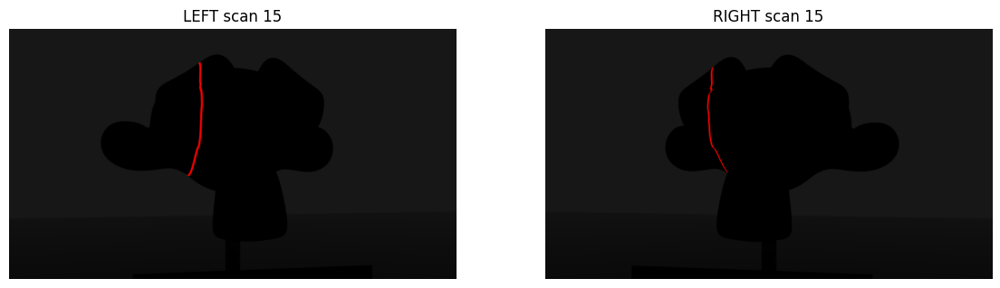

In [14]:
# --- lecture + affichage d'une paire (sanity check) ---

import cv2
import matplotlib.pyplot as plt

i = 15  # change à 5, 10, 20... si tu veux tester

imgL = cv2.imread(filesL[i])
imgR = cv2.imread(filesR[i])

print("Left shape :", imgL.shape)
print("Right shape:", imgR.shape)

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(imgL, cv2.COLOR_BGR2RGB))
plt.title(f"LEFT scan {i:02d}")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(imgR, cv2.COLOR_BGR2RGB))
plt.title(f"RIGHT scan {i:02d}")
plt.axis("off")

plt.show()


## 13. Rectification of Scanned Images
We now apply the transformation logic learned from the calibration to the actual object scans.
* **Reusing Maps**: We use the exact same rectification maps (`map1`, `map2`) calculated previously. This ensures that the geometric model remains consistent.
* **Visual Check**
* **Why it matters**: This step is mandatory before detecting the laser. It guarantees that if a laser point is at $y=150$ in the left image, its match in the right image is also at $y=150$.

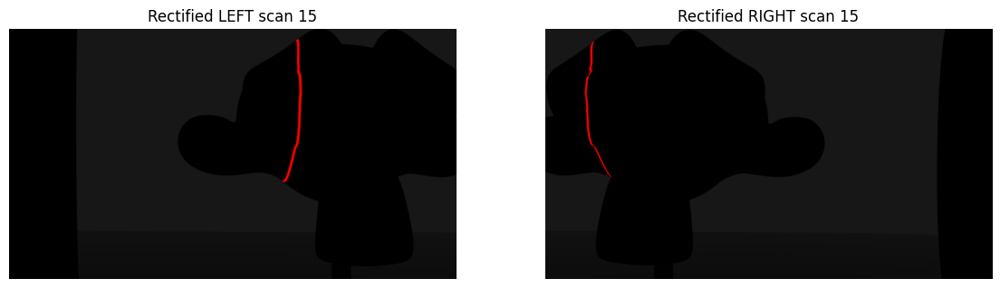

In [15]:
# --- rectification d'une paire scan (remap) ---

import cv2
import matplotlib.pyplot as plt

i = 15  # change si tu veux

imgL = cv2.imread(filesL[i])
imgR = cv2.imread(filesR[i])

# Rectification via les maps déjà calculées
rectL = cv2.remap(imgL, map1L, map2L, cv2.INTER_LINEAR)
rectR = cv2.remap(imgR, map1R, map2R, cv2.INTER_LINEAR)

# Affichage
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(rectL, cv2.COLOR_BGR2RGB))
plt.title(f"Rectified LEFT scan {i:02d}")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(rectR, cv2.COLOR_BGR2RGB))
plt.title(f"Rectified RIGHT scan {i:02d}")
plt.axis("off")

plt.show()


## 13.2 Epipolar lines on rectified pair

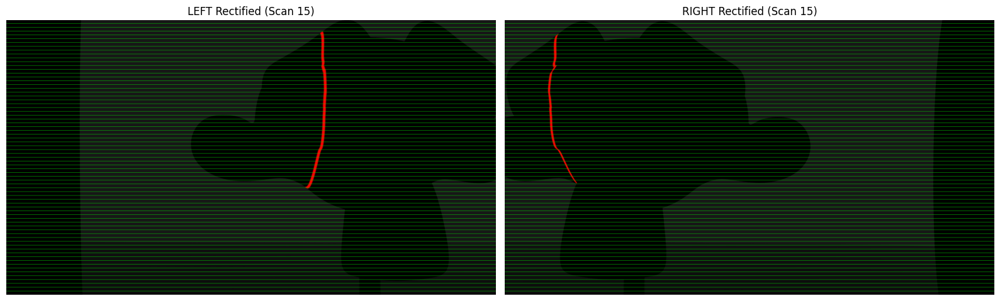

In [16]:

import cv2
import matplotlib.pyplot as plt

# 1. On choisit une image où on voit bien le singe (ex: scan 15 ou 12)
idx_visu = 15

# On charge les images brutes
imgL_scan = cv2.imread(filesL[idx_visu])
imgR_scan = cv2.imread(filesR[idx_visu])

# 2. On applique la rectification (C'est l'étape CRUCIALE)
# Sans ça, les lignes ne correspondraient pas du tout.
rectL_scan = cv2.remap(imgL_scan, map1L, map2L, cv2.INTER_LINEAR)
rectR_scan = cv2.remap(imgR_scan, map1R, map2R, cv2.INTER_LINEAR)

# 3. On dessine des lignes horizontales
# Comme l'image est rectifiée, ligne épipolaire = ligne horizontale parfaite
visL = rectL_scan.copy()
visR = rectR_scan.copy()

height, width = visL.shape[:2]

# On trace une ligne verte tous les 15 pixels
for y in range(0, height, 15):
    cv2.line(visL, (0, y), (width, y), (0, 255, 0), 1) # (0, 255, 0) = Vert
    cv2.line(visR, (0, y), (width, y), (0, 255, 0), 1)

# 4. Affichage
plt.figure(figsize=(16, 8))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(visL, cv2.COLOR_BGR2RGB))
plt.title(f"LEFT Rectified (Scan {idx_visu})")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(visR, cv2.COLOR_BGR2RGB))
plt.title(f"RIGHT Rectified (Scan {idx_visu})")
plt.axis("off")

plt.tight_layout()
plt.show()

## 14. Laser Segmentation
To reconstruct the object, we use the **laser scanning** principle.
* **HSV Color Space**: We convert the image to HSV (Hue, Saturation, Value) because it is more robust to lighting changes when detecting the red laser color.
* **Binary Mask**: We isolate the red pixels.
* **Center of Mass**: For each image row, we calculate the average position of the red pixels to obtain sub-pixel precision of the laser's location.

Scan 15 -> points détectés: Left=617 | Right=586 | Commun=586


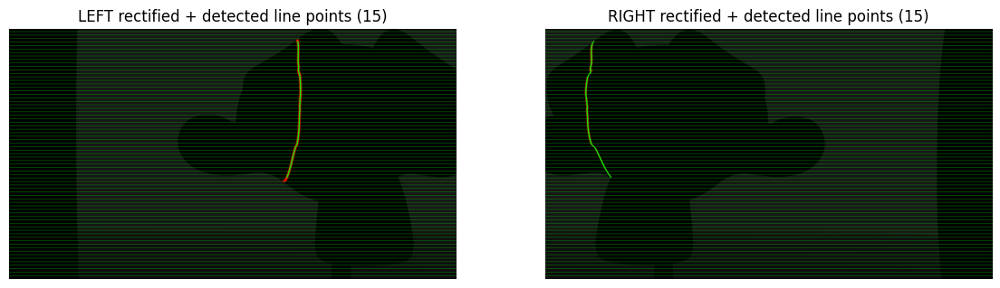

In [17]:
# --- détection de la ligne rouge (points 2D) ---

import cv2
import numpy as np
import matplotlib.pyplot as plt

i = 15  # choisis un index 0..25 pour tester

# 1) Lire une paire
imgL = cv2.imread(filesL[i])
imgR = cv2.imread(filesR[i])

# 2) Rectifier (undistort + alignement épipolaire)
rectL = cv2.remap(imgL, map1L, map2L, cv2.INTER_LINEAR)
rectR = cv2.remap(imgR, map1R, map2R, cv2.INTER_LINEAR)

# 3) Détection du "rouge" en HSV (OpenCV: H in [0..179])
hsvL = cv2.cvtColor(rectL, cv2.COLOR_BGR2HSV)
hsvR = cv2.cvtColor(rectR, cv2.COLOR_BGR2HSV)

# Rouge = deux zones de hue (près de 0 et près de 179)
# S et V pas trop stricts car ta ligne peut être "orange/rouge" et pas ultra saturée
lower1 = (0,   50, 50)
upper1 = (12,  255, 255)
lower2 = (170, 50, 50)
upper2 = (179, 255, 255)

maskL = cv2.inRange(hsvL, lower1, upper1) | cv2.inRange(hsvL, lower2, upper2)
maskR = cv2.inRange(hsvR, lower1, upper1) | cv2.inRange(hsvR, lower2, upper2)

# Nettoyage (enlever petits points + rendre la ligne plus "continue")
kernel = np.ones((3, 3), np.uint8)
maskL = cv2.morphologyEx(maskL, cv2.MORPH_OPEN, kernel, iterations=1)
maskL = cv2.morphologyEx(maskL, cv2.MORPH_CLOSE, kernel, iterations=2)

maskR = cv2.morphologyEx(maskR, cv2.MORPH_OPEN, kernel, iterations=1)
maskR = cv2.morphologyEx(maskR, cv2.MORPH_CLOSE, kernel, iterations=2)

# 4) Extraire 1 point par ligne y : x = moyenne des pixels rouges sur cette ligne
H, W = maskL.shape

xL_of_y = np.full(H, np.nan, dtype=np.float32)
xR_of_y = np.full(H, np.nan, dtype=np.float32)

for y in range(H):
    xs = np.where(maskL[y] > 0)[0]
    if xs.size > 0:
        xL_of_y[y] = float(xs.mean())

    xs = np.where(maskR[y] > 0)[0]
    if xs.size > 0:
        xR_of_y[y] = float(xs.mean())

# 5) Garder seulement les y où on a la ligne à gauche ET à droite (mêmes y -> rectification)
y_valid = np.where(np.isfinite(xL_of_y) & np.isfinite(xR_of_y))[0]

# Points 2D correspondants (format float32)
ptsL = np.column_stack([xL_of_y[y_valid], y_valid]).astype(np.float32)  # (N,2)
ptsR = np.column_stack([xR_of_y[y_valid], y_valid]).astype(np.float32)  # (N,2)

print(f"Scan {i:02d} -> points détectés: Left={np.isfinite(xL_of_y).sum()} | Right={np.isfinite(xR_of_y).sum()} | Commun={len(y_valid)}")

# 6) Visualisation (overlay des points détectés)
visL = rectL.copy()
visR = rectR.copy()

for (x, y) in ptsL:
    cv2.circle(visL, (int(round(x)), int(y)), 2, (0, 255, 0), -1)  # vert
for (x, y) in ptsR:
    cv2.circle(visR, (int(round(x)), int(y)), 2, (0, 255, 0), -1)

# On trace une ligne verte tous les 30 pixels
for y in range(0, height, 15):
    cv2.line(visL, (0, y), (width, y), (0, 255, 0), 1) # (0, 255, 0) = Vert
    cv2.line(visR, (0, y), (width, y), (0, 255, 0), 1)

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(visL, cv2.COLOR_BGR2RGB))
plt.title(f"LEFT rectified + detected line points ({i:02d})")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(visR, cv2.COLOR_BGR2RGB))
plt.title(f"RIGHT rectified + detected line points ({i:02d})")
plt.axis("off")

plt.show()


## 15. 3D Reconstruction (Triangulation)
We loop through the 26 scans to build the complete point cloud.
For every laser point detected on the left $(u_L, v_L)$ and right $(u_R, v_R)$:
1. **Validation**: We verify that the point is visible in both views.
2. **Triangulation**: We use the projection matrices $P1$ and $P2$ (from calibration) to calculate the intersection of the optical rays in 3D space.
   * Simplified formula: $Z = \frac{f \cdot B}{d}$ (where $d$ is the disparity $u_L - u_R$).

Scan 00 -> pts communs = 0 | pts 3D gardés = 0
Scan 01 -> pts communs = 0 | pts 3D gardés = 0
Scan 02 -> pts communs = 0 | pts 3D gardés = 0
Scan 03 -> pts communs = 0 | pts 3D gardés = 0
Scan 04 -> pts communs = 0 | pts 3D gardés = 0
Scan 05 -> pts communs = 107 | pts 3D gardés = 107
Scan 06 -> pts communs = 205 | pts 3D gardés = 205
Scan 07 -> pts communs = 136 | pts 3D gardés = 136
Scan 08 -> pts communs = 68 | pts 3D gardés = 68
Scan 09 -> pts communs = 478 | pts 3D gardés = 478
Scan 10 -> pts communs = 567 | pts 3D gardés = 567
Scan 11 -> pts communs = 872 | pts 3D gardés = 872
Scan 12 -> pts communs = 923 | pts 3D gardés = 923


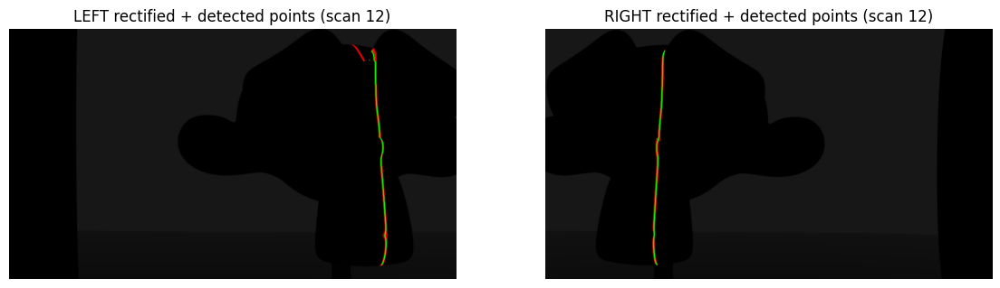

Scan 13 -> pts communs = 905 | pts 3D gardés = 905
Scan 14 -> pts communs = 918 | pts 3D gardés = 918
Scan 15 -> pts communs = 582 | pts 3D gardés = 582
Scan 16 -> pts communs = 487 | pts 3D gardés = 487
Scan 17 -> pts communs = 263 | pts 3D gardés = 263
Scan 18 -> pts communs = 138 | pts 3D gardés = 138
Scan 19 -> pts communs = 219 | pts 3D gardés = 219
Scan 20 -> pts communs = 202 | pts 3D gardés = 202
Scan 21 -> pts communs = 0 | pts 3D gardés = 0
Scan 22 -> pts communs = 0 | pts 3D gardés = 0
Scan 23 -> pts communs = 0 | pts 3D gardés = 0
Scan 24 -> pts communs = 0 | pts 3D gardés = 0
Scan 25 -> pts communs = 0 | pts 3D gardés = 0

TOTAL points 3D: 7070


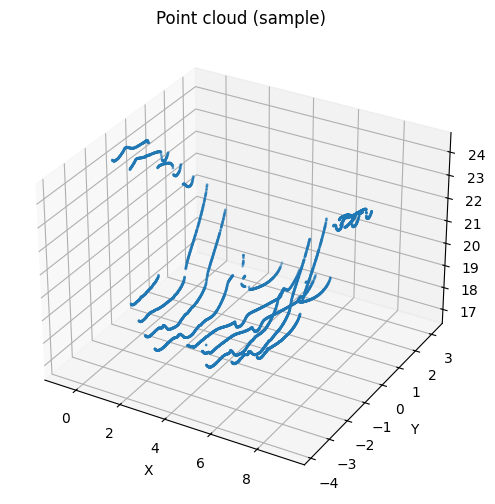

In [18]:
# --- Reconstruction 3D du singe (triangulation des lignes rouges sur 26 scans) ---

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Debug : affiche 1 scan pour vérifier la détection
debug_show = True
debug_i = 12  # 0..25

all_points_3d = []   # liste de tableaux (Ni, 3)
all_scan_ids = []    # pour savoir de quel scan vient chaque point

# Seuils HSV pour le rouge (2 zones de Hue)
lower1 = (0,   50, 50)
upper1 = (12,  255, 255)
lower2 = (170, 50, 50)
upper2 = (179, 255, 255)

kernel = np.ones((3, 3), np.uint8)

for i in range(len(filesL)):

    # 1) Lire les images du scan i
    imgL = cv2.imread(filesL[i])
    imgR = cv2.imread(filesR[i])

    # 2) Rectifier (même géométrie que celle utilisée pour P1/P2)
    rectL = cv2.remap(imgL, map1L, map2L, cv2.INTER_LINEAR)
    rectR = cv2.remap(imgR, map1R, map2R, cv2.INTER_LINEAR)

    # 3) Détecter la ligne rouge (masque binaire)
    hsvL = cv2.cvtColor(rectL, cv2.COLOR_BGR2HSV)
    hsvR = cv2.cvtColor(rectR, cv2.COLOR_BGR2HSV)

    maskL = cv2.inRange(hsvL, lower1, upper1) | cv2.inRange(hsvL, lower2, upper2)
    maskR = cv2.inRange(hsvR, lower1, upper1) | cv2.inRange(hsvR, lower2, upper2)

    # Nettoyage : enlève bruit + reconnecte la ligne
    maskL = cv2.morphologyEx(maskL, cv2.MORPH_OPEN,  kernel, iterations=1)
    maskL = cv2.morphologyEx(maskL, cv2.MORPH_CLOSE, kernel, iterations=2)
    maskR = cv2.morphologyEx(maskR, cv2.MORPH_OPEN,  kernel, iterations=1)
    maskR = cv2.morphologyEx(maskR, cv2.MORPH_CLOSE, kernel, iterations=2)

    # 4) Extraire des correspondances 2D : 1 point par ligne y
    H, W = maskL.shape
    xL_of_y = np.full(H, np.nan, dtype=np.float32)
    xR_of_y = np.full(H, np.nan, dtype=np.float32)

    for y in range(H):
        xsL = np.where(maskL[y] > 0)[0]
        xsR = np.where(maskR[y] > 0)[0]

        # Petit filtre anti-bruit : si trop peu de pixels rouges, on ignore la ligne y
        if xsL.size >= 5:
            xL_of_y[y] = float(np.median(xsL))  # médiane = plus robuste que mean
        if xsR.size >= 5:
            xR_of_y[y] = float(np.median(xsR))

    # y où on a la ligne à gauche ET à droite (important : mêmes y -> rectification)
    y_valid = np.where(np.isfinite(xL_of_y) & np.isfinite(xR_of_y))[0]

    ptsL = np.column_stack([xL_of_y[y_valid], y_valid]).astype(np.float64)  # (N,2)
    ptsR = np.column_stack([xR_of_y[y_valid], y_valid]).astype(np.float64)  # (N,2)

    # 5) Triangulation : passe de (xL,y) & (xR,y) -> (X,Y,Z)
    # cv2.triangulatePoints veut du 2xN
    if len(y_valid) >= 8:
        X4 = cv2.triangulatePoints(P1_rect, P2_rect, ptsL.T, ptsR.T)   # (4, N)
        X3 = (X4[:3] / X4[3]).T                               # (N, 3)

        # Nettoyage minimal : garder seulement les points "numériquement ok"
        ok = np.isfinite(X3).all(axis=1)
        X3 = X3[ok]

        all_points_3d.append(X3)
        all_scan_ids.append(np.full((X3.shape[0],), i, dtype=np.int32))

    print(f"Scan {i:02d} -> pts communs = {len(y_valid)} | pts 3D gardés = {0 if len(y_valid)<8 else X3.shape[0]}")

    # Debug visuel sur un scan
    if debug_show and i == debug_i:
        visL = rectL.copy()
        visR = rectR.copy()
        for (x, y) in ptsL:
            cv2.circle(visL, (int(round(x)), int(y)), 2, (0, 255, 0), -1)
        for (x, y) in ptsR:
            cv2.circle(visR, (int(round(x)), int(y)), 2, (0, 255, 0), -1)

        plt.figure(figsize=(14, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(visL, cv2.COLOR_BGR2RGB))
        plt.title(f"LEFT rectified + detected points (scan {i:02d})")
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(visR, cv2.COLOR_BGR2RGB))
        plt.title(f"RIGHT rectified + detected points (scan {i:02d})")
        plt.axis("off")
        plt.show()

# 6) Fusionner toutes les listes en un seul nuage de points
points_3D = np.vstack(all_points_3d) if len(all_points_3d) > 0 else np.zeros((0, 3))
scan_id_per_point = np.concatenate(all_scan_ids) if len(all_scan_ids) > 0 else np.zeros((0,), dtype=np.int32)

print("\nTOTAL points 3D:", points_3D.shape[0])

# 7) Visualisation rapide (échantillon pour ne pas exploser l'affichage)
if points_3D.shape[0] > 0:
    nb_show = min(6000, points_3D.shape[0])
    idx = np.random.choice(points_3D.shape[0], nb_show, replace=False)
    Xs = points_3D[idx]

    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, projection="3d")
    ax.scatter(Xs[:,0], Xs[:,1], Xs[:,2], s=1)
    ax.set_title("Point cloud (sample)")
    ax.set_xlabel("X"); ax.set_ylabel("Y"); ax.set_zlabel("Z")
    plt.show()


## 16. Final Visualization
We display the resulting point cloud.
* **Cleaning**: We remove infinite points or outliers generated by noise.
* **Rotation**: To demonstrate that the reconstruction is truly 3D (and not just a flat image), we generate a rotating animation.

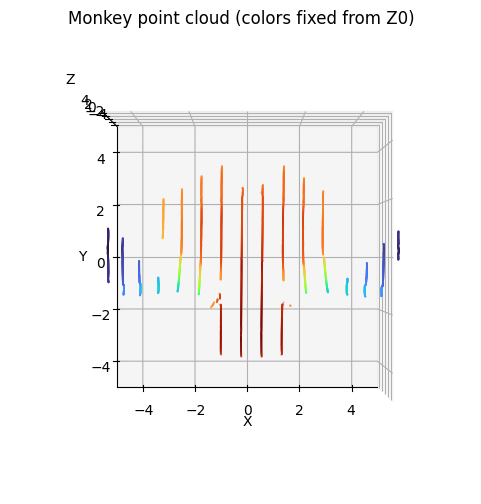

In [19]:
# --- Animation : rotation autour de Y (positions) + couleurs FIXES selon Z initial ---

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

X = points_3D.copy()
X = X[np.isfinite(X).all(axis=1)]

# Centrer
center = X.mean(axis=0)
Xc = X - center
Xc[:, 1] *= -1

# Limites fixes
ptp = np.ptp(Xc, axis=0)
max_range = float(np.max(ptp)) if np.max(ptp) > 0 else 1.0
half = 0.5 * max_range

# Couleurs FIXES selon Z initial (proche=rouge, loin=bleu, avec dégradé)
# turbo : bleu -> vert -> jaune -> rouge
Z0 = Xc[:, 2]
zmin, zmax = float(Z0.min()), float(Z0.max())
zn = (Z0 - zmin) / (zmax - zmin + 1e-9)   # 0..1
prox = 1.0 - zn                            # petit Z => rouge (valeur haute)
colors_fixed = cm.turbo(prox)

def rot_y(theta):
    c, s = np.cos(theta), np.sin(theta)
    return np.array([[ c, 0,  s],
                     [ 0, 1,  0],
                     [-s, 0,  c]], dtype=float)

# Figure
fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111, projection="3d")
ax.set_title("Monkey point cloud (colors fixed from Z0)")
ax.set_xlabel("X"); ax.set_ylabel("Y"); ax.set_zlabel("Z")

ax.set_xlim(-half, half)
ax.set_ylim(-half, half)
ax.set_zlim(-half, half)
ax.set_box_aspect((1, 1, 1))

# vue du dessus au départ
ax.view_init(elev=90, azim=-90)

# Init
Xr0 = Xc @ rot_y(0.0).T
sc = ax.scatter(Xr0[:,0], Xr0[:,1], Xr0[:,2],
                s=2, c=colors_fixed, linewidths=0)

def update(frame):
    theta = np.deg2rad(frame)
    Xr = Xc @ rot_y(theta).T
    sc._offsets3d = (Xr[:,0], Xr[:,1], Xr[:,2])
    # on ne change PAS sc.set_facecolor -> couleurs figées
    return (sc,)

ani = FuncAnimation(fig, update, frames=np.arange(0, 360, 2), interval=40, blit=False)
HTML(ani.to_jshtml())
